In [1]:
import tensorflow as tf
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import os
from google.colab import files
import zipfile

print("✅ Google Colab environment ready!")
print(f"TensorFlow version: {tf.__version__}")

# Upload your files
print("📤 Step 1: Upload your image files")
print("Click the folder icon on the left → Upload your building images")

# Create the same folder structure
os.makedirs('building_project/images', exist_ok=True)
os.makedirs('building_project/masks', exist_ok=True)

def list_uploaded_files():
    print("\n📁 Files in your Colab environment:")
    for item in os.listdir('.'):
        if os.path.isdir(item):
            print(f"   📁 {item}/")
        else:
            print(f"   📄 {item}")

list_uploaded_files()

✅ Google Colab environment ready!
TensorFlow version: 2.19.0
📤 Step 1: Upload your image files
Click the folder icon on the left → Upload your building images

📁 Files in your Colab environment:
   📁 .config/
   📁 drive/
   📁 .ipynb_checkpoints/
   📁 building_project/
   📁 sample_data/



🚀 LOADING FILES...
📖 Loading original image: EPSG7856_Date20250823_Lat-27.570534_Lon152.879532_Mpp0.600_Vert.jpg
✅ Image loaded: (3578, 6034, 3)
✅ World file (.jgw) data loaded:
   Pixel Size: (0.6, -0.6)
   Upper Left: (486298.500000, 6951437.100000)


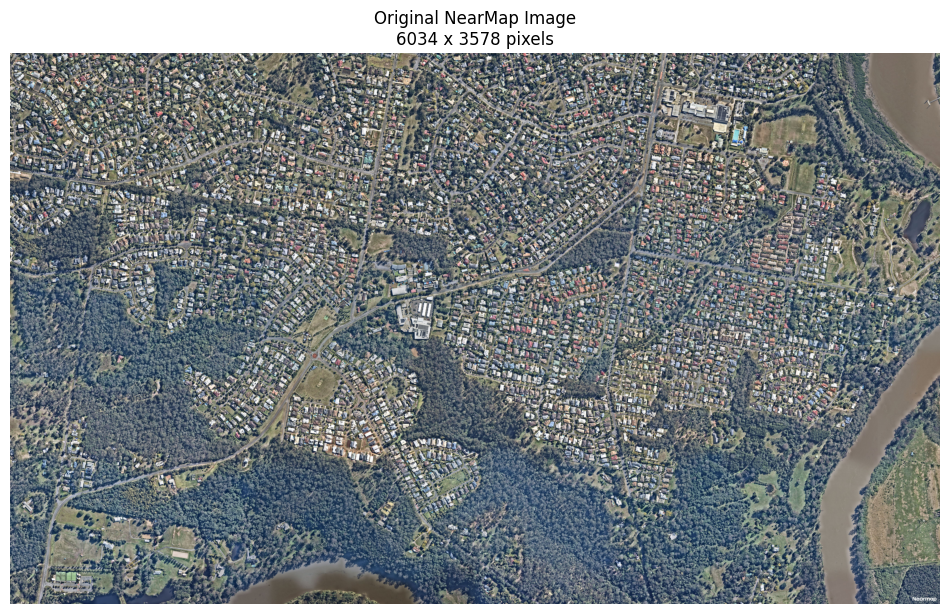

🎉 SUCCESS! Original image loaded with georeferencing!


In [6]:
if 'original_jpg' in locals() and 'original_jgw' in locals():
    print("\n🚀 LOADING FILES...")

    try:
        original_image, original_world_data = load_original_with_georef(original_jpg, original_jgw)

        # Display the original
        plt.figure(figsize=(12, 8))
        plt.imshow(original_image)
        plt.title(f"Original NearMap Image\n{original_image.shape[1]} x {original_image.shape[0]} pixels")
        plt.axis('off')
        plt.show()

        print("🎉 SUCCESS! Original image loaded with georeferencing!")

    except Exception as e:
        print(f"❌ Error loading files: {e}")
else:
    print("❌ File paths not set. Please run the previous cell first.")

In [12]:
def create_georeferenced_tiles_from_original(image, world_data, tile_size=512):
    """Create tiles that properly inherit georeferencing from original"""
    print(f"✂️ Creating {tile_size}x{tile_size} tiles from original image...")

    height, width = image.shape[:2]
    tiles = []
    tile_info = []

    tile_count = 0
    for y in range(0, height, tile_size):
        for x in range(0, width, tile_size):
            tile = image[y:y+tile_size, x:x+tile_size]

            # Only take complete tiles
            if tile.shape[0] == tile_size and tile.shape[1] == tile_size:
                # Calculate geographic position for this tile
                tile_world_data = calculate_tile_georef(x, y, world_data, tile_size)

                tiles.append(tile)
                tile_info.append({
                    'source_image': world_data['source_file'],
                    'pixel_x': x,
                    'pixel_y': y,
                    'world_data': tile_world_data,
                    'tile_size': tile_size
                })
                tile_count += 1

    print(f"✅ Created {tile_count} properly georeferenced tiles")
    return np.array(tiles), tile_info

def calculate_tile_georef(x, y, source_world_data, tile_size):
    """Calculate precise geographic coordinates for each tile"""
    tile_world_data = source_world_data.copy()

    # Calculate new upper left corner for this tile
    pixel_size_x = source_world_data['pixel_size_x']
    pixel_size_y = source_world_data['pixel_size_y']  # Usually negative for images

    tile_upper_left_x = source_world_data['upper_left_x'] + (x * pixel_size_x)
    tile_upper_left_y = source_world_data['upper_left_y'] + (y * pixel_size_y)

    # Update with tile-specific coordinates
    tile_world_data['tile_upper_left_x'] = tile_upper_left_x
    tile_world_data['tile_upper_left_y'] = tile_upper_left_y
    tile_world_data['tile_pixel_x'] = x
    tile_world_data['tile_pixel_y'] = y

    return tile_world_data

# Create the tiles
tiles, tile_info = create_georeferenced_tiles_from_original(original_image, original_world_data, tile_size=512)

print(f"🎉 Created {len(tiles)} tiles in memory")

✂️ Creating 512x512 tiles from original image...
✅ Created 66 properly georeferenced tiles
🎉 Created 66 tiles in memory


In [16]:
print(f"\n💾 SAVING TILES TO {tiles_folder}/...")

saved_files = []
for i, (tile, info) in enumerate(zip(tiles, tile_info)):
    # Create descriptive filename
    filename = f"tile_{i:03d}_x{info['pixel_x']}_y{info['pixel_y']}.jpg"
    filepath = f"{tiles_folder}/{filename}"

    # Save tile as high-quality JPEG
    cv2.imwrite(filepath, cv2.cvtColor(tile, cv2.COLOR_RGB2BGR))
    saved_files.append({
        'filename': filename,
        'filepath': filepath,
        'pixel_x': info['pixel_x'],
        'pixel_y': info['pixel_y'],
        'world_data': info['world_data']
    })

    # Show progress for first 5 files
    if i < 5:
        print(f"   ✅ {filename}")
        if info['world_data']:
            geo_x = info['world_data']['tile_upper_left_x']
            geo_y = info['world_data']['tile_upper_left_y']
            print(f"       Geo: ({geo_x:.6f}, {geo_y:.6f})")

print(f"🎉 Saved {len(saved_files)} tiles to '{tiles_folder}/'")


💾 SAVING TILES TO building_project/tiles/...
   ✅ tile_000_x0_y0.jpg
       Geo: (486298.500000, 6951437.100000)
   ✅ tile_001_x512_y0.jpg
       Geo: (486605.700000, 6951437.100000)
   ✅ tile_002_x1024_y0.jpg
       Geo: (486912.900000, 6951437.100000)
   ✅ tile_003_x1536_y0.jpg
       Geo: (487220.100000, 6951437.100000)
   ✅ tile_004_x2048_y0.jpg
       Geo: (487527.300000, 6951437.100000)
🎉 Saved 66 tiles to 'building_project/tiles/'


In [22]:
print("📁 CREATING ANNOTATIONS FOLDER IN building_project...")

# Create annotations folder inside building_project
annotations_folder = 'building_project/annotations'
os.makedirs(annotations_folder, exist_ok=True)
print(f"✅ Created '{annotations_folder}'")

# Check the current structure
print("\n📁 CURRENT building_project STRUCTURE:")
if os.path.exists('building_project'):
    for item in sorted(os.listdir('building_project')):
        item_path = f'building_project/{item}'
        if os.path.isdir(item_path):
            print(f"   📁 {item}/")
            # Show a few files from each folder
            for file in sorted(os.listdir(item_path))[:2]:
                print(f"      📄 {file}")
        else:
            print(f"   📄 {item}")

print("""
📤 PLEASE UPLOAD YOUR COCO JSON FILE:

1. Click the file upload button that will appear below
2. Select your COCO JSON file
3. Wait for upload to complete
""")

# Upload the file
uploaded = files.upload()

# Process uploaded files - move to building_project/annotations/
for filename in uploaded.keys():
    print(f"✅ Uploaded: {filename}")

    if filename.endswith('.json'):
        os.rename(filename, f'{annotations_folder}/{filename}')
        print(f"📁 Moved to: {annotations_folder}/{filename}")
    else:
        print(f"⚠️  Not a JSON file: {filename}")

# Verify the upload
print(f"\n🔍 VERIFYING UPLOAD IN {annotations_folder}:")
if os.path.exists(annotations_folder):
    annotation_files = os.listdir(annotations_folder)
    if annotation_files:
        print("✅ Files in annotations folder:")
        for file in annotation_files:
            file_path = f'{annotations_folder}/{file}'
            file_size = os.path.getsize(file_path) / 1024  # Size in KB
            print(f"   📄 {file} ({file_size:.1f} KB)")
    else:
        print("❌ No files in annotations folder")
else:
    print("❌ annotations folder doesn't exist")


📁 CREATING ANNOTATIONS FOLDER IN building_project...
✅ Created 'building_project/annotations'

📁 CURRENT building_project STRUCTURE:
   📁 .ipynb_checkpoints/
   📁 annotations/
   📁 images/
      📄 EPSG7856_Date20250823_Lat-27.570534_Lon152.879532_Mpp0.600_Vert.jgw
      📄 EPSG7856_Date20250823_Lat-27.570534_Lon152.879532_Mpp0.600_Vert.jpg
   📁 masks/
   📁 tiles/
      📄 tile_000_x0_y0.jpg
      📄 tile_001_x512_y0.jpg

📤 PLEASE UPLOAD YOUR COCO JSON FILE:

1. Click the file upload button that will appear below
2. Select your COCO JSON file
3. Wait for upload to complete



Saving _annotations.coco.json to _annotations.coco.json
✅ Uploaded: _annotations.coco.json
📁 Moved to: building_project/annotations/_annotations.coco.json

🔍 VERIFYING UPLOAD IN building_project/annotations:
✅ Files in annotations folder:
   📄 _annotations.coco.json (69.2 KB)


In [25]:
def load_coco_annotations():
    """Load and parse COCO JSON annotations from building_project/annotations/"""
    print("🔍 LOADING COCO ANNOTATIONS...")

    annotations_folder = 'building_project/annotations'

    # Check if annotations folder exists and has files
    if not os.path.exists(annotations_folder):
        print(f"❌ '{annotations_folder}' not found")
        return None

    json_files = [f for f in os.listdir(annotations_folder) if f.endswith('.json')]

    if not json_files:
        print(f"❌ No JSON files found in '{annotations_folder}'")
        return None

    coco_file = f"{annotations_folder}/{json_files[0]}"
    print(f"📖 Loading: {coco_file}")

    try:
        with open(coco_file, 'r') as f:
            coco_data = json.load(f)

        print("✅ COCO data loaded successfully!")
        print(f"   Images: {len(coco_data['images'])}")
        print(f"   Annotations: {len(coco_data['annotations'])}")
        print(f"   Categories: {len(coco_data['categories'])}")

        # Show category information
        print("\n🎯 Categories found:")
        for category in coco_data['categories']:
            print(f"   • '{category['name']}' (id: {category['id']})")

        return coco_data

    except Exception as e:
        print(f"❌ Error loading COCO file: {e}")
        return None

# Load the annotations FIRST
coco_data = load_coco_annotations()

🔍 LOADING COCO ANNOTATIONS...
📖 Loading: building_project/annotations/_annotations.coco.json
✅ COCO data loaded successfully!
   Images: 5
   Annotations: 232
   Categories: 2

🎯 Categories found:
   • 'objects' (id: 0)
   • 'objects' (id: 1)


In [26]:
def create_segmentation_masks(coco_data, tiles_folder, masks_folder):
    """Convert COCO polygon annotations to binary segmentation masks"""
    print("🎨 CREATING SEGMENTATION MASKS FROM COCO ANNOTATIONS...")

    # Create masks folder
    os.makedirs(masks_folder, exist_ok=True)

    # Get ALL objects category IDs (there are two: 0 and 1)
    objects_category_ids = []
    for category in coco_data['categories']:
        if category['name'].lower() == 'objects':
            objects_category_ids.append(category['id'])

    if not objects_category_ids:
        print("❌ No 'objects' categories found in annotations")
        print("Available categories:")
        for category in coco_data['categories']:
            print(f"   • '{category['name']}' (id: {category['id']})")
        return None

    print(f"🎯 Objects category IDs: {objects_category_ids}")
    print("   (Will combine annotations from both categories)")

    # Process each image
    masks_created = 0
    for image_info in coco_data['images']:
        image_id = image_info['id']
        filename = image_info['file_name']

        print(f"🔍 Processing: {filename}")

        # Find the corresponding tile
        tile_path = None
        possible_paths = [
            f"{tiles_folder}/{filename}",
            f"{tiles_folder}/{filename.replace('building_tile_', 'tile_')}",
            f"{tiles_folder}/{filename.replace('.jpg', '_x0_y0.jpg')}"
        ]

        for path in possible_paths:
            if os.path.exists(path):
                tile_path = path
                break

        if not tile_path:
            print(f"⚠️  Could not find tile for: {filename}")
            continue

        # Load the tile to get dimensions
        tile = cv2.imread(tile_path)
        if tile is None:
            print(f"⚠️  Could not load tile: {tile_path}")
            continue

        height, width = tile.shape[:2]

        # Create empty mask
        mask = np.zeros((height, width), dtype=np.uint8)

        # Get all annotations for this image from BOTH objects categories
        image_annotations = []
        for category_id in objects_category_ids:
            category_annotations = [ann for ann in coco_data['annotations']
                                  if ann['image_id'] == image_id and ann['category_id'] == category_id]
            image_annotations.extend(category_annotations)

        print(f"   Found {len(image_annotations)} object annotations (combined from categories {objects_category_ids})")

        # Draw each object polygon on the mask
        objects_drawn = 0
        for annotation in image_annotations:
            segmentation = annotation['segmentation']

            # COCO segmentation can be a list of polygons
            for polygon in segmentation:
                try:
                    # Convert flat [x1,y1,x2,y2,...] to [[x1,y1],[x2,y2],...]
                    points = np.array(polygon, dtype=np.int32).reshape(-1, 2)

                    # Fill the polygon
                    cv2.fillPoly(mask, [points], 255)
                    objects_drawn += 1
                except Exception as e:
                    print(f"   ⚠️  Error drawing polygon: {e}")
                    continue

        # Save the mask
        mask_filename = f"mask_{os.path.splitext(filename)[0]}.png"
        mask_path = f"{masks_folder}/{mask_filename}"
        cv2.imwrite(mask_path, mask)

        masks_created += 1
        print(f"✅ Created mask: {mask_filename} ({objects_drawn} objects drawn)")

    print(f"🎉 Created {masks_created} segmentation masks in {masks_folder}/!")
    return masks_created

# Create the masks
if coco_data:
    masks_folder = 'building_project/masks'
    tiles_folder = 'building_project/tiles'

    masks_created = create_segmentation_masks(coco_data, tiles_folder, masks_folder)

    # Show sample mask
    if masks_created > 0:
        # Find the first mask and corresponding tile
        mask_files = [f for f in os.listdir(masks_folder) if f.endswith('.png')]
        if mask_files:
            sample_mask_path = f"{masks_folder}/{mask_files[0]}"
            sample_mask = cv2.imread(sample_mask_path, cv2.IMREAD_GRAYSCALE)

            # Find corresponding tile
            base_name = mask_files[0].replace('mask_', '').replace('.png', '')
            tile_files = [f for f in os.listdir(tiles_folder) if base_name in f and f.endswith('.jpg')]

            if tile_files:
                sample_tile_path = f"{tiles_folder}/{tile_files[0]}"
                sample_tile = cv2.imread(sample_tile_path)
                sample_tile = cv2.cvtColor(sample_tile, cv2.COLOR_BGR2RGB)

                import matplotlib.pyplot as plt

                plt.figure(figsize=(15, 5))
                plt.subplot(1, 3, 1)
                plt.imshow(sample_tile)
                plt.title('Input Tile')
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.imshow(sample_mask, cmap='gray')
                plt.title('Objects Mask')
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.imshow(sample_tile)
                plt.imshow(sample_mask, cmap='jet', alpha=0.5)
                plt.title('Objects Overlay')
                plt.axis('off')

                plt.tight_layout()
                plt.show()
else:
    print("❌ No COCO data loaded - cannot create masks")

🎨 CREATING SEGMENTATION MASKS FROM COCO ANNOTATIONS...
🎯 Objects category IDs: [0, 1]
   (Will combine annotations from both categories)
🔍 Processing: building_tile_1_jpg.rf.28881ea3bd943ad0e5e4cd18af878f59.jpg
⚠️  Could not find tile for: building_tile_1_jpg.rf.28881ea3bd943ad0e5e4cd18af878f59.jpg
🔍 Processing: building_tile_4_jpg.rf.e990a22985ecd45ffb381b69da4baefe.jpg
⚠️  Could not find tile for: building_tile_4_jpg.rf.e990a22985ecd45ffb381b69da4baefe.jpg
🔍 Processing: building_tile_2_jpg.rf.6fa728db17e1cf171ee56d36ea138290.jpg
⚠️  Could not find tile for: building_tile_2_jpg.rf.6fa728db17e1cf171ee56d36ea138290.jpg
🔍 Processing: building_tile_3_jpg.rf.3941edf1e17137bb20af5d063c225de9.jpg
⚠️  Could not find tile for: building_tile_3_jpg.rf.3941edf1e17137bb20af5d063c225de9.jpg
🔍 Processing: building_tile_5_jpg.rf.f4284577a020b8638b7dd0d43e4045f3.jpg
⚠️  Could not find tile for: building_tile_5_jpg.rf.f4284577a020b8638b7dd0d43e4045f3.jpg
🎉 Created 0 segmentation masks in building_proje

In [27]:
print("🔍 CHECKING ACTUAL TILE FILES...")

tiles_folder = 'building_project/tiles'
if os.path.exists(tiles_folder):
    tile_files = [f for f in os.listdir(tiles_folder) if f.endswith('.jpg')]
    print(f"📁 Found {len(tile_files)} tile files in {tiles_folder}:")
    for tile_file in sorted(tile_files)[:10]:  # Show first 10
        print(f"   📄 {tile_file}")

    if len(tile_files) > 10:
        print(f"   ... and {len(tile_files) - 10} more files")
else:
    print(f"❌ {tiles_folder} not found")

🔍 CHECKING ACTUAL TILE FILES...
📁 Found 66 tile files in building_project/tiles:
   📄 tile_000_x0_y0.jpg
   📄 tile_001_x512_y0.jpg
   📄 tile_002_x1024_y0.jpg
   📄 tile_003_x1536_y0.jpg
   📄 tile_004_x2048_y0.jpg
   📄 tile_005_x2560_y0.jpg
   📄 tile_006_x3072_y0.jpg
   📄 tile_007_x3584_y0.jpg
   📄 tile_008_x4096_y0.jpg
   📄 tile_009_x4608_y0.jpg
   ... and 56 more files


In [28]:
def create_segmentation_masks_fixed(coco_data, tiles_folder, masks_folder):
    """Convert COCO polygon annotations to binary segmentation masks with smart file matching"""
    print("🎨 CREATING SEGMENTATION MASKS (WITH SMART FILE MATCHING)...")

    # Create masks folder
    os.makedirs(masks_folder, exist_ok=True)

    # Get ALL objects category IDs
    objects_category_ids = []
    for category in coco_data['categories']:
        if category['name'].lower() == 'objects':
            objects_category_ids.append(category['id'])

    print(f"🎯 Objects category IDs: {objects_category_ids}")

    # Get all available tile files
    available_tile_files = [f for f in os.listdir(tiles_folder) if f.endswith('.jpg')]
    print(f"📁 Available tile files: {len(available_tile_files)}")

    # Create a mapping from simple names to actual filenames
    tile_mapping = {}
    for tile_file in available_tile_files:
        # Extract simple name (remove positions and extensions)
        simple_name = tile_file.replace('tile_', '').replace('_x', '_').replace('_y', '_')
        simple_name = simple_name.split('_')[0]  # Get just the number part
        tile_mapping[simple_name] = tile_file

    print("🔗 File mapping:")
    for simple_name, actual_file in list(tile_mapping.items())[:5]:
        print(f"   {simple_name} → {actual_file}")

    # Process each image with smart matching
    masks_created = 0
    for image_info in coco_data['images']:
        image_id = image_info['id']
        roboflow_filename = image_info['file_name']

        print(f"🔍 Processing: {roboflow_filename}")

        # Extract the tile number from Roboflow filename
        # Format: building_tile_1_jpg.rf.28881ea3bd943ad0e5e4cd18af878f59.jpg
        try:
            # Get the number part (e.g., "1" from "building_tile_1_jpg.rf...")
            tile_number = roboflow_filename.split('_')[2]  # Gets the number
            print(f"   Extracted tile number: {tile_number}")
        except:
            print(f"   ⚠️  Could not extract tile number from: {roboflow_filename}")
            continue

        # Find matching tile file
        tile_path = None
        for available_file in available_tile_files:
            if f"tile_{tile_number.zfill(3)}" in available_file or f"tile_{tile_number}_" in available_file:
                tile_path = f"{tiles_folder}/{available_file}"
                break

        if not tile_path:
            print(f"   ⚠️  Could not find matching tile for number: {tile_number}")
            print(f"   Available files containing '{tile_number}':")
            for file in available_tile_files:
                if tile_number in file:
                    print(f"      📄 {file}")
            continue

        print(f"   ✅ Found matching tile: {os.path.basename(tile_path)}")

        # Load the tile to get dimensions
        tile = cv2.imread(tile_path)
        if tile is None:
            print(f"   ⚠️  Could not load tile: {tile_path}")
            continue

        height, width = tile.shape[:2]

        # Create empty mask
        mask = np.zeros((height, width), dtype=np.uint8)

        # Get all annotations for this image from BOTH objects categories
        image_annotations = []
        for category_id in objects_category_ids:
            category_annotations = [ann for ann in coco_data['annotations']
                                  if ann['image_id'] == image_id and ann['category_id'] == category_id]
            image_annotations.extend(category_annotations)

        print(f"   Found {len(image_annotations)} object annotations")

        # Draw each object polygon on the mask
        objects_drawn = 0
        for annotation in image_annotations:
            segmentation = annotation['segmentation']

            # COCO segmentation can be a list of polygons
            for polygon in segmentation:
                try:
                    # Convert flat [x1,y1,x2,y2,...] to [[x1,y1],[x2,y2],...]
                    points = np.array(polygon, dtype=np.int32).reshape(-1, 2)

                    # Fill the polygon
                    cv2.fillPoly(mask, [points], 255)
                    objects_drawn += 1
                except Exception as e:
                    print(f"   ⚠️  Error drawing polygon: {e}")
                    continue

        # Save the mask
        mask_filename = f"mask_tile_{tile_number}.png"
        mask_path = f"{masks_folder}/{mask_filename}"
        cv2.imwrite(mask_path, mask)

        masks_created += 1
        print(f"   ✅ Created mask: {mask_filename} ({objects_drawn} objects drawn)")

    print(f"🎉 Created {masks_created} segmentation masks in {masks_folder}/!")
    return masks_created

# Create the masks with fixed file matching
if coco_data:
    masks_folder = 'building_project/masks'
    tiles_folder = 'building_project/tiles'

    masks_created = create_segmentation_masks_fixed(coco_data, tiles_folder, masks_folder)
else:
    print("❌ No COCO data loaded")

🎨 CREATING SEGMENTATION MASKS (WITH SMART FILE MATCHING)...
🎯 Objects category IDs: [0, 1]
📁 Available tile files: 66
🔗 File mapping:
   051 → tile_051_x3584_y2048.jpg
   011 → tile_011_x0_y512.jpg
   035 → tile_035_x1024_y1536.jpg
   048 → tile_048_x2048_y2048.jpg
   027 → tile_027_x2560_y1024.jpg
🔍 Processing: building_tile_1_jpg.rf.28881ea3bd943ad0e5e4cd18af878f59.jpg
   Extracted tile number: 1
   ✅ Found matching tile: tile_001_x512_y0.jpg
   Found 44 object annotations
   ✅ Created mask: mask_tile_1.png (44 objects drawn)
🔍 Processing: building_tile_4_jpg.rf.e990a22985ecd45ffb381b69da4baefe.jpg
   Extracted tile number: 4
   ✅ Found matching tile: tile_004_x2048_y0.jpg
   Found 57 object annotations
   ✅ Created mask: mask_tile_4.png (57 objects drawn)
🔍 Processing: building_tile_2_jpg.rf.6fa728db17e1cf171ee56d36ea138290.jpg
   Extracted tile number: 2
   ✅ Found matching tile: tile_002_x1024_y0.jpg
   Found 39 object annotations
   ✅ Created mask: mask_tile_2.png (39 objects dra

In [29]:
import zipfile
import os

def download_all_tiles_as_zip():
    """Create a ZIP file with all tiles and download it"""

    tile_files = [f for f in os.listdir('building_project/tiles') if f.endswith('.jpg')]

    # Create ZIP file
    zip_filename = 'building_tiles.zip'
    with zipfile.ZipFile(zip_filename, 'w') as zipf:
        for tile_file in tile_files:
            file_path = f'building_project/tiles/{tile_file}'
            zipf.write(file_path, tile_file)

    # Download the ZIP
    files.download(zip_filename)
    print(f"✅ Downloading ZIP with {len(tile_files)} tiles...")

# Run this
download_all_tiles_as_zip()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Downloading ZIP with 66 tiles...


In [30]:
def prepare_training_data_corrected(tiles_folder, masks_folder):
    """Prepare X (images) and y (masks) for training with correct mapping"""
    print("📊 PREPARING TRAINING DATA WITH CORRECT MAPPING...")

    # Your correct mapping
    tile_mapping = {
        'building_tile_1': 'tile_000_x0_y0.jpg',
        'building_tile_2': 'tile_016_x2560_y512.jpg',
        'building_tile_3': 'tile_009_x4608_y0.jpg',
        'building_tile_4': 'tile_011_x0_y512.jpg',
        'building_tile_5': 'tile_015_x2048_y512.jpg'
    }

    # Get all tile files and mask files
    tile_files = [f for f in os.listdir(tiles_folder) if f.endswith('.jpg')]
    mask_files = [f for f in os.listdir(masks_folder) if f.endswith('.png')]

    print(f"   Available tiles: {len(tile_files)}")
    print(f"   Available masks: {len(mask_files)}")

    X_train = []
    y_train = []
    valid_pairs = []

    # Use the correct mapping
    for mask_num in range(1, 6):
        mask_file = f"mask_tile_{mask_num}.png"
        building_tile_key = f"building_tile_{mask_num}"

        if mask_file in mask_files and building_tile_key in tile_mapping:
            tile_file = tile_mapping[building_tile_key]

            if tile_file in tile_files:
                # Load tile
                tile_path = f"{tiles_folder}/{tile_file}"
                tile = cv2.imread(tile_path)
                tile = cv2.cvtColor(tile, cv2.COLOR_BGR2RGB)

                # Load mask
                mask_path = f"{masks_folder}/{mask_file}"
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

                # Resize to standard size (512x512)
                tile = cv2.resize(tile, (512, 512))
                mask = cv2.resize(mask, (512, 512))

                # Normalize
                tile = tile.astype(np.float32) / 255.0
                mask = (mask > 127).astype(np.float32)  # Binary mask (0 or 1)

                X_train.append(tile)
                y_train.append(mask)
                valid_pairs.append((tile_file, mask_file))
                print(f"✅ Added training pair: {tile_file} ↔ {mask_file}")
            else:
                print(f"❌ Tile file not found: {tile_file}")
        else:
            print(f"❌ Mask file not found: {mask_file}")

    if X_train:
        X_train = np.array(X_train)
        y_train = np.array(y_train)
        y_train = np.expand_dims(y_train, axis=-1)  # Add channel dimension

        print(f"\n🎉 PREPARED {len(X_train)} TRAINING SAMPLES!")
        print(f"   X shape: {X_train.shape}")  # (samples, 512, 512, 3)
        print(f"   y shape: {y_train.shape}")  # (samples, 512, 512, 1)

        # Show annotation statistics
        total_pixels = sum([np.sum(mask > 0.5) for mask in y_train])
        print(f"   Total building pixels in training set: {int(total_pixels)}")

        return X_train, y_train, valid_pairs
    else:
        print("❌ No valid training pairs found!")
        return None, None, None

# Run the corrected version
X_train, y_train, valid_pairs = prepare_training_data_corrected('building_project/tiles', 'building_project/masks')

📊 PREPARING TRAINING DATA WITH CORRECT MAPPING...
   Available tiles: 66
   Available masks: 5
✅ Added training pair: tile_000_x0_y0.jpg ↔ mask_tile_1.png
✅ Added training pair: tile_016_x2560_y512.jpg ↔ mask_tile_2.png
✅ Added training pair: tile_009_x4608_y0.jpg ↔ mask_tile_3.png
✅ Added training pair: tile_011_x0_y512.jpg ↔ mask_tile_4.png
✅ Added training pair: tile_015_x2048_y512.jpg ↔ mask_tile_5.png

🎉 PREPARED 5 TRAINING SAMPLES!
   X shape: (5, 512, 512, 3)
   y shape: (5, 512, 512, 1)
   Total building pixels in training set: 205529


In [31]:
def build_unet_model(input_shape=(512, 512, 3)):
    """Build a U-Net model for building segmentation"""

    # Encoder (Downsampling)
    inputs = tf.keras.layers.Input(shape=input_shape)

    # Contracting Path
    c1 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

    c2 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

    c3 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

    # Bottleneck
    c4 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same')(c4)

    # Expansive Path (Upsampling)
    u5 = tf.keras.layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c4)
    u5 = tf.keras.layers.concatenate([u5, c3])
    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(u5)
    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c5)

    u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c2])
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u6)
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c6)

    u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c1])
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u7)
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c7)

    # Output layer
    outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c7)

    model = tf.keras.models.Model(inputs=inputs, outputs=outputs)
    return model

# Build the model
print("🔄 Building U-Net model...")
model = build_unet_model()
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy', 'precision', 'recall'])
print("✅ Model built successfully!")
model.summary()

🔄 Building U-Net model...
✅ Model built successfully!


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 128, 128,  │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 64, 64,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 64, 64,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 128, 128,  │    524,544 │ conv2d_7[0][0]    │
│ (Conv2DTranspose)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 128, 128,  │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 512)              │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 128, 128,  │  1,179,904 │ concatenate[0][0] │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 128, 128,  │    590,080 │ conv2d_8[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_1  │ (None, 256, 256,  │    131,200 │ conv2d_9[0][0]  

 Total params: 7,697,345 (29.36 MB)

 Trainable params: 7,697,345 (29.36 MB)

 Non-trainable params: 0 (0.00 B)

In [32]:
# Train the model
print("🎯 Starting training...")
history = model.fit(
    X_train, y_train,
    batch_size=2,
    epochs=50,
    validation_split=0.2,
    shuffle=True,
    verbose=1
)

print("✅ Training completed!")

🎯 Starting training...
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 101s 53s/step - accuracy: 0.7927 - loss: 0.6722 - precision: 0.1437 - recall: 0.0881 - val_accuracy: 0.8118 - val_loss: 0.5104 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 92s 49s/step - accuracy: 0.8470 - loss: 1.1304 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.8118 - val_loss: 0.5052 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 88s 47s/step - accuracy: 0.8517 - loss: 0.4591 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.8118 - val_loss: 0.5535 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 146s 52s/step - accuracy: 0.8517 - loss: 0.5380 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.8118 - val_loss: 0.5588 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 140s 47s/step - accuracy: 0.8517 - loss: 0.5388 - preci

In [33]:
def predict_on_all_tiles(model, tiles_folder):
    """Make predictions on all 66 tiles (including the 5 training ones for comparison)"""
    print("🔮 MAKING PREDICTIONS ON ALL TILES...")

    tile_files = sorted([f for f in os.listdir(tiles_folder) if f.endswith('.jpg')])
    predictions = {}

    for tile_file in tile_files:
        # Load and preprocess tile
        tile_path = f"{tiles_folder}/{tile_file}"
        tile = cv2.imread(tile_path)
        tile = cv2.cvtColor(tile, cv2.COLOR_BGR2RGB)

        # Store original dimensions for later
        original_shape = tile.shape[:2]

        # Preprocess like training data
        tile_resized = cv2.resize(tile, (512, 512))
        tile_normalized = tile_resized.astype(np.float32) / 255.0
        tile_batch = np.expand_dims(tile_normalized, axis=0)  # Add batch dimension

        # Predict
        pred_mask = model.predict(tile_batch, verbose=0)[0]  # Remove batch dimension

        # Resize prediction back to original size if needed
        pred_mask_resized = cv2.resize(pred_mask, (original_shape[1], original_shape[0]))

        predictions[tile_file] = {
            'original_tile': tile,
            'prediction': pred_mask_resized,
            'binary_mask': (pred_mask_resized > 0.5).astype(np.uint8) * 255
        }

        print(f"✅ Processed: {tile_file}")

    print(f"🎯 Predictions completed for {len(predictions)} tiles")
    return predictions

# Make predictions on all tiles
all_predictions = predict_on_all_tiles(model, 'building_project/tiles')

🔮 MAKING PREDICTIONS ON ALL TILES...
✅ Processed: tile_000_x0_y0.jpg
✅ Processed: tile_001_x512_y0.jpg
✅ Processed: tile_002_x1024_y0.jpg
✅ Processed: tile_003_x1536_y0.jpg
✅ Processed: tile_004_x2048_y0.jpg
✅ Processed: tile_005_x2560_y0.jpg
✅ Processed: tile_006_x3072_y0.jpg
✅ Processed: tile_007_x3584_y0.jpg
✅ Processed: tile_008_x4096_y0.jpg
✅ Processed: tile_009_x4608_y0.jpg
✅ Processed: tile_010_x5120_y0.jpg
✅ Processed: tile_011_x0_y512.jpg
✅ Processed: tile_012_x512_y512.jpg
✅ Processed: tile_013_x1024_y512.jpg
✅ Processed: tile_014_x1536_y512.jpg
✅ Processed: tile_015_x2048_y512.jpg
✅ Processed: tile_016_x2560_y512.jpg
✅ Processed: tile_017_x3072_y512.jpg
✅ Processed: tile_018_x3584_y512.jpg
✅ Processed: tile_019_x4096_y512.jpg
✅ Processed: tile_020_x4608_y512.jpg
✅ Processed: tile_021_x5120_y512.jpg
✅ Processed: tile_022_x0_y1024.jpg
✅ Processed: tile_023_x512_y1024.jpg
✅ Processed: tile_024_x1024_y1024.jpg
✅ Processed: tile_025_x1536_y1024.jpg
✅ Processed: tile_026_x2048_y10

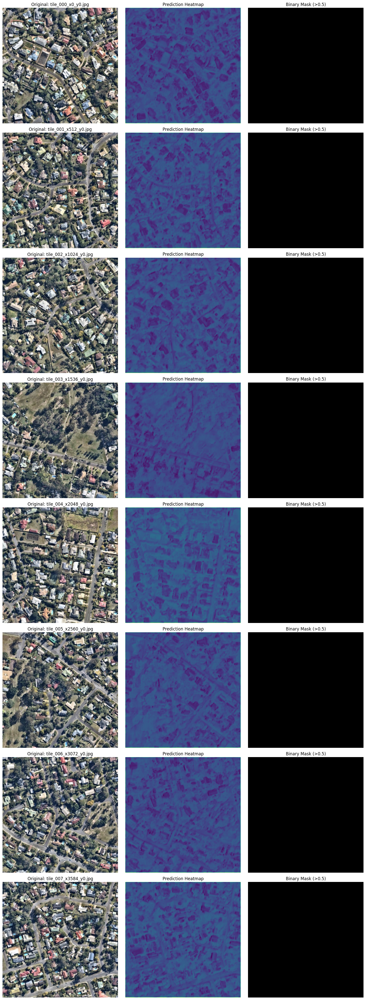

In [34]:
def visualize_predictions(predictions, num_samples=8):
    """Visualize original tiles vs predictions"""
    import matplotlib.pyplot as plt

    tile_files = list(predictions.keys())

    # Show some random samples
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))

    for i in range(num_samples):
        tile_file = tile_files[i]
        data = predictions[tile_file]

        # Original tile
        axes[i, 0].imshow(data['original_tile'])
        axes[i, 0].set_title(f"Original: {tile_file}")
        axes[i, 0].axis('off')

        # Prediction heatmap
        axes[i, 1].imshow(data['prediction'], cmap='viridis')
        axes[i, 1].set_title("Prediction Heatmap")
        axes[i, 1].axis('off')

        # Binary mask
        axes[i, 2].imshow(data['binary_mask'], cmap='gray')
        axes[i, 2].set_title("Binary Mask (>0.5)")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize some predictions
visualize_predictions(all_predictions)

In [35]:
def compare_training_vs_test(predictions, training_tiles):
    """Compare predictions on training tiles vs completely new tiles"""

    training_results = {}
    test_results = {}

    for tile_file, data in predictions.items():
        # Calculate building coverage percentage
        building_pixels = np.sum(data['binary_mask'] > 0)
        total_pixels = data['binary_mask'].size
        coverage_pct = (building_pixels / total_pixels) * 100

        if any(training_tile in tile_file for training_tile in training_tiles):
            training_results[tile_file] = coverage_pct
        else:
            test_results[tile_file] = coverage_pct

    print("🏠 BUILDING COVERAGE STATISTICS:")
    print(f"   Training tiles ({len(training_results)}): "
          f"Avg coverage = {np.mean(list(training_results.values())):.2f}%")
    print(f"   Test tiles ({len(test_results)}): "
          f"Avg coverage = {np.mean(list(test_results.values())):.2f}%")

    return training_results, test_results

# Define which tiles were used for training
training_tile_names = [
    'tile_000_x0_y0.jpg',
    'tile_016_x2560_y512.jpg',
    'tile_009_x4608_y0.jpg',
    'tile_011_x0_y512.jpg',
    'tile_015_x2048_y512.jpg'
]

training_coverage, test_coverage = compare_training_vs_test(all_predictions, training_tile_names)

🏠 BUILDING COVERAGE STATISTICS:
   Training tiles (5): Avg coverage = 0.00%
   Test tiles (61): Avg coverage = 0.00%


In [40]:
def build_unet_with_class_weights(input_shape=(512, 512, 3)):
    """Build U-Net with better initialization for imbalanced data"""

    # Calculate class weights
    building_pixels = np.sum(y_train > 0.5)
    total_pixels = y_train.size
    background_pixels = total_pixels - building_pixels

    # Higher weight for building class (rare)
    building_weight = background_pixels / total_pixels
    background_weight = building_pixels / total_pixels

    print(f"🎯 Using class weights - Background: {background_weight:.3f}, Building: {building_weight:.3f}")

    # Same architecture as before, but with different loss
    inputs = tf.keras.layers.Input(shape=input_shape)

    # Your U-Net architecture here (same as before)
    # ... [your U-Net code] ...

    # Use weighted binary crossentropy or focal loss
    model = tf.keras.models.Model(inputs=inputs, outputs=outputs)

    # Option A: Weighted binary crossentropy
    def weighted_bce(y_true, y_pred):
        weights = y_true * building_weight + (1 - y_true) * background_weight
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
        return tf.reduce_mean(weights * bce)

    # Option B: Focal loss (better for severe imbalance)
    def focal_loss(gamma=2.0, alpha=0.25):
        def focal_loss_fixed(y_true, y_pred):
            pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
            pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
            return -tf.reduce_sum(alpha * tf.pow(1. - pt_1, gamma) * tf.math.log(pt_1)) \
                   -tf.reduce_sum((1-alpha) * tf.pow(pt_0, gamma) * tf.math.log(1. - pt_0))
        return focal_loss_fixed

    model.compile(optimizer='adam',
                  loss=weighted_bce,  # or focal_loss()
                  metrics=['accuracy'])

    return model

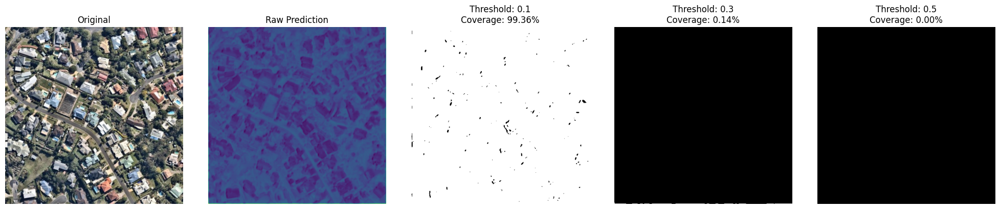

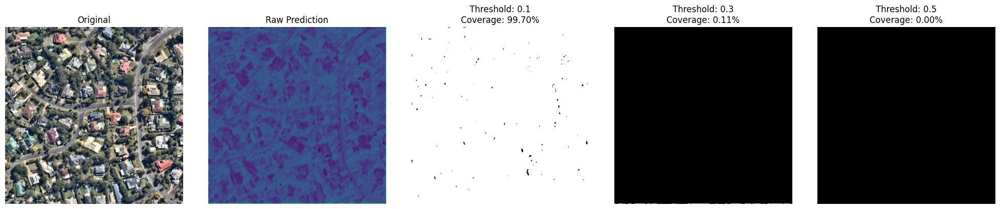

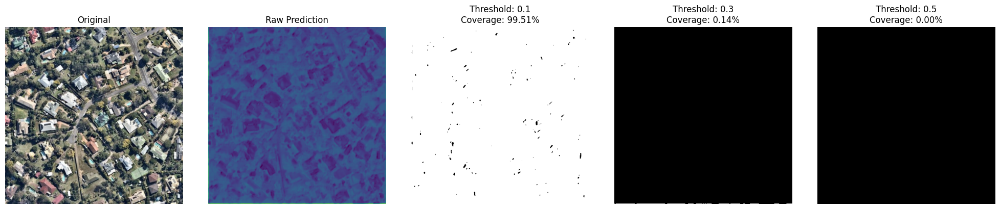

In [41]:
def visualize_with_different_thresholds(predictions, thresholds=[0.1, 0.3, 0.5]):
    """Try different thresholds to see if model is detecting anything"""

    for tile_file, data in list(predictions.items())[:3]:  # First 3 tiles
        fig, axes = plt.subplots(1, len(thresholds) + 2, figsize=(20, 4))

        # Original
        axes[0].imshow(data['original_tile'])
        axes[0].set_title("Original")
        axes[0].axis('off')

        # Prediction heatmap
        axes[1].imshow(data['prediction'], cmap='viridis')
        axes[1].set_title("Raw Prediction")
        axes[1].axis('off')

        # Different thresholds
        for i, threshold in enumerate(thresholds):
            binary_mask = (data['prediction'] > threshold).astype(np.uint8) * 255
            coverage = np.sum(binary_mask > 0) / binary_mask.size * 100

            axes[i+2].imshow(binary_mask, cmap='gray')
            axes[i+2].set_title(f"Threshold: {threshold}\nCoverage: {coverage:.2f}%")
            axes[i+2].axis('off')

        plt.tight_layout()
        plt.show()

# Try different thresholds
visualize_with_different_thresholds(all_predictions)

In [43]:
def quick_diagnosis():
    """Quick diagnosis to understand the problem"""
    print("🔍 RUNNING QUICK DIAGNOSIS...")

    # Check training data
    total_pixels = y_train.size
    building_pixels = np.sum(y_train > 0.5)
    building_coverage = building_pixels / total_pixels * 100

    print(f"📊 TRAINING DATA ANALYSIS:")
    print(f"   Total pixels: {total_pixels:,}")
    print(f"   Building pixels: {building_pixels:,}")
    print(f"   Building coverage: {building_coverage:.4f}%")
    print(f"   Imbalance ratio: 1:{int((total_pixels - building_pixels) / building_pixels)}")

    # Check current model predictions
    sample_pred = model.predict(X_train[:2], verbose=0)
    print(f"📈 CURRENT MODEL PREDICTIONS:")
    print(f"   Min: {np.min(sample_pred):.6f}")
    print(f"   Max: {np.max(sample_pred):.6f}")
    print(f"   Mean: {np.mean(sample_pred):.6f}")
    print(f"   Std: {np.std(sample_pred):.6f}")

    # Check what threshold would actually detect something
    for threshold in [0.1, 0.01, 0.001, 0.0001]:
        detected_pixels = np.sum(sample_pred > threshold)
        coverage = detected_pixels / sample_pred.size * 100
        print(f"   Threshold {threshold}: {coverage:.2f}% coverage")

# Run diagnosis first
quick_diagnosis()

🔍 RUNNING QUICK DIAGNOSIS...
📊 TRAINING DATA ANALYSIS:
   Total pixels: 1,310,720
   Building pixels: 205,529
   Building coverage: 15.6806%
   Imbalance ratio: 1:5
📈 CURRENT MODEL PREDICTIONS:
   Min: 0.074179
   Max: 0.392577
   Mean: 0.141536
   Std: 0.019221
   Threshold 0.1: 99.44% coverage
   Threshold 0.01: 100.00% coverage
   Threshold 0.001: 100.00% coverage
   Threshold 0.0001: 100.00% coverage


In [44]:
def analyze_model_failure(model, X_train, y_train):
    """Detailed analysis of why model isn't learning"""
    print("🔍 DETAILED MODEL FAILURE ANALYSIS...")

    # Get predictions on training data
    train_preds = model.predict(X_train, verbose=0)

    print("📈 PREDICTION DISTRIBUTION:")
    print(f"   Min: {np.min(train_preds):.8f}")
    print(f"   Max: {np.max(train_preds):.8f}")
    print(f"   Mean: {np.mean(train_preds):.8f}")
    print(f"   Median: {np.median(train_preds):.8f}")
    print(f"   Std: {np.std(train_preds):.8f}")

    # Check if predictions are collapsed (all same value)
    unique_vals = np.unique(train_preds.round(6))
    print(f"   Unique values (rounded): {len(unique_vals)}")
    if len(unique_vals) < 10:
        print(f"   Values: {unique_vals}")

    # Check loss on training data
    loss = model.evaluate(X_train, y_train, verbose=0)
    print(f"📊 Current training loss: {loss[0]:.4f}")

    # Check gradient issues
    if np.std(train_preds) < 0.001:
        print("❌ PREDICTIONS ARE COLLAPSED - MODEL ISN'T LEARNING")
        print("   Possible causes: Learning rate too high, gradient explosion/vanish")
    elif np.mean(train_preds) < 0.01:
        print("❌ MODEL IS TOO CONSERVATIVE - ALL PREDICTIONS NEAR 0")
    else:
        print("✅ Predictions have reasonable variance")

# Run detailed analysis
analyze_model_failure(model, X_train, y_train)

🔍 DETAILED MODEL FAILURE ANALYSIS...
📈 PREDICTION DISTRIBUTION:
   Min: 0.07009008
   Max: 0.39257717
   Mean: 0.14142254
   Median: 0.14359304
   Std: 0.01897675
   Unique values (rounded): 92031
📊 Current training loss: 0.4373
✅ Predictions have reasonable variance


In [45]:
def find_optimal_threshold(model, X_train, y_train):
    """Find the best threshold for this model's prediction distribution"""
    print("🎯 FINDING OPTIMAL THRESHOLD...")

    # Get predictions
    preds = model.predict(X_train, verbose=0)

    # Try different thresholds
    thresholds = [0.1, 0.12, 0.14, 0.16, 0.18, 0.2, 0.25, 0.3]

    best_threshold = 0.5
    best_f1 = 0

    for threshold in thresholds:
        # Convert to binary
        binary_preds = (preds > threshold).astype(np.float32)

        # Calculate metrics
        true_positives = np.sum((binary_preds == 1) & (y_train == 1))
        false_positives = np.sum((binary_preds == 1) & (y_train == 0))
        false_negatives = np.sum((binary_preds == 0) & (y_train == 1))

        # Avoid division by zero
        if true_positives + false_positives > 0:
            precision = true_positives / (true_positives + false_positives)
        else:
            precision = 0

        if true_positives + false_negatives > 0:
            recall = true_positives / (true_positives + false_negatives)
        else:
            recall = 0

        if precision + recall > 0:
            f1 = 2 * (precision * recall) / (precision + recall)
        else:
            f1 = 0

        print(f"   Threshold {threshold:.2f}: Precision={precision:.3f}, Recall={recall:.3f}, F1={f1:.3f}")

        if f1 > best_f1:
            best_f1 = f1
            best_threshold = threshold

    print(f"🎯 OPTIMAL THRESHOLD: {best_threshold:.2f} (F1-score: {best_f1:.3f})")
    return best_threshold

# Find the best threshold for your model
optimal_threshold = find_optimal_threshold(model, X_train, y_train)

🎯 FINDING OPTIMAL THRESHOLD...
   Threshold 0.10: Precision=0.157, Recall=0.995, F1=0.271
   Threshold 0.12: Precision=0.158, Recall=0.879, F1=0.268
   Threshold 0.14: Precision=0.154, Recall=0.576, F1=0.243
   Threshold 0.16: Precision=0.129, Recall=0.056, F1=0.078
   Threshold 0.18: Precision=0.113, Recall=0.008, F1=0.015
   Threshold 0.20: Precision=0.110, Recall=0.006, F1=0.012
   Threshold 0.25: Precision=0.118, Recall=0.003, F1=0.006
   Threshold 0.30: Precision=0.172, Recall=0.001, F1=0.003
🎯 OPTIMAL THRESHOLD: 0.10 (F1-score: 0.271)


In [47]:
def predict_with_optimal_threshold(model, tiles_folder, threshold=0.10):
    """Use the optimal threshold for this model"""

    tile_files = sorted([f for f in os.listdir(tiles_folder) if f.endswith('.jpg')])
    predictions = {}

    for tile_file in tile_files:
        # Load and preprocess tile
        tile_path = f"{tiles_folder}/{tile_file}"
        tile = cv2.imread(tile_path)
        tile = cv2.cvtColor(tile, cv2.COLOR_BGR2RGB)
        original_shape = tile.shape[:2]

        # Preprocess
        tile_resized = cv2.resize(tile, (512, 512))
        tile_normalized = tile_resized.astype(np.float32) / 255.0
        tile_batch = np.expand_dims(tile_normalized, axis=0)

        # Predict
        pred_mask = model.predict(tile_batch, verbose=0)[0]
        pred_mask_resized = cv2.resize(pred_mask, (original_shape[1], original_shape[0]))

        predictions[tile_file] = {
            'original_tile': tile,
            'prediction': pred_mask_resized,
            'binary_mask': (pred_mask_resized > threshold).astype(np.uint8) * 255
        }

    return predictions

def analyze_new_predictions(predictions, training_tiles):
    """Analyze the new predictions with optimal threshold"""

    training_coverages = []
    test_coverages = []

    for tile_file, data in predictions.items():
        coverage = np.sum(data['binary_mask'] > 0) / data['binary_mask'].size * 100

        if any(training_tile in tile_file for training_tile in training_tiles):
            training_coverages.append(coverage)
        else:
            test_coverages.append(coverage)

    print("🏠 NEW BUILDING COVERAGE STATISTICS:")
    print(f"   Training tiles ({len(training_coverages)}): Avg coverage = {np.mean(training_coverages):.2f}%")
    print(f"   Test tiles ({len(test_coverages)}): Avg coverage = {np.mean(test_coverages):.2f}%")

    return training_coverages, test_coverages

# Use the optimal threshold of 0.10
optimal_threshold = 0.10

# Re-run predictions with optimal threshold
print(f"🔄 RE-RUNNING PREDICTIONS WITH OPTIMAL THRESHOLD {optimal_threshold:.2f}...")
new_predictions = predict_with_optimal_threshold(model, 'building_project/tiles', threshold=optimal_threshold)

# Analyze the new results
training_tile_names = [
    'tile_000_x0_y0.jpg',
    'tile_016_x2560_y512.jpg',
    'tile_009_x4608_y0.jpg',
    'tile_011_x0_y512.jpg',
    'tile_015_x2048_y512.jpg'
]

training_cov, test_cov = analyze_new_predictions(new_predictions, training_tile_names)


🔄 RE-RUNNING PREDICTIONS WITH OPTIMAL THRESHOLD 0.10...
🏠 NEW BUILDING COVERAGE STATISTICS:
   Training tiles (5): Avg coverage = 99.38%
   Test tiles (61): Avg coverage = 99.51%


📊 DETAILED PREDICTION DISTRIBUTION ANALYSIS...
📈 PREDICTION VALUE DISTRIBUTION:
    0th percentile: 0.0636
    1th percentile: 0.1033
    5th percentile: 0.1139
   10th percentile: 0.1213
   25th percentile: 0.1334
   50th percentile: 0.1423
   75th percentile: 0.1498
   90th percentile: 0.1559
   95th percentile: 0.1594
   99th percentile: 0.1863
   100th percentile: 0.3926


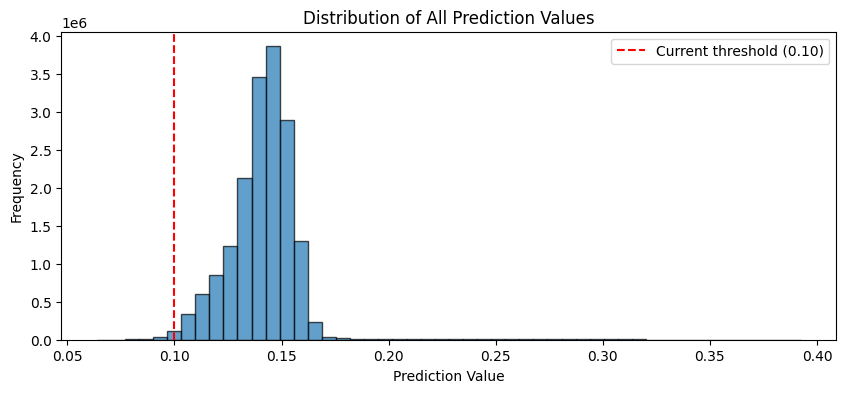

In [49]:
def analyze_prediction_distribution(predictions):
    """Analyze what the model is actually predicting"""
    print("📊 DETAILED PREDICTION DISTRIBUTION ANALYSIS...")

    all_predictions = []
    for tile_file, data in predictions.items():
        all_predictions.extend(data['prediction'].flatten())

    all_predictions = np.array(all_predictions)

    # Calculate percentiles
    percentiles = [0, 1, 5, 10, 25, 50, 75, 90, 95, 99, 100]
    percentile_values = np.percentile(all_predictions, percentiles)

    print("📈 PREDICTION VALUE DISTRIBUTION:")
    for p, val in zip(percentiles, percentile_values):
        print(f"   {p:2d}th percentile: {val:.4f}")

    # Show histogram
    plt.figure(figsize=(10, 4))
    plt.hist(all_predictions, bins=50, alpha=0.7, edgecolor='black')
    plt.axvline(x=0.10, color='red', linestyle='--', label='Current threshold (0.10)')
    plt.xlabel('Prediction Value')
    plt.ylabel('Frequency')
    plt.title('Distribution of All Prediction Values')
    plt.legend()
    plt.show()

    return all_predictions

# Analyze what values the model is actually producing
all_pred_values = analyze_prediction_distribution(new_predictions)

In [50]:
def adaptive_thresholding(predictions):
    """Use adaptive thresholds based on each tile's prediction distribution"""

    adaptive_predictions = {}

    for tile_file, data in predictions.items():
        pred = data['prediction']

        # Calculate tile-specific statistics
        pred_flat = pred.flatten()

        # Method 1: Use percentiles relative to each tile
        p95 = np.percentile(pred_flat, 95)  # 95th percentile as threshold
        p90 = np.percentile(pred_flat, 90)  # 90th percentile as threshold
        p85 = np.percentile(pred_flat, 85)  # 85th percentile as threshold

        # Try different percentile-based thresholds
        threshold_95 = p95
        threshold_90 = p90
        threshold_85 = p85

        # Method 2: Mean + standard deviation
        mean_val = np.mean(pred_flat)
        std_val = np.std(pred_flat)
        threshold_std = mean_val + 1.0 * std_val

        # Use the most appropriate threshold
        final_threshold = threshold_90  # Start with 90th percentile

        adaptive_predictions[tile_file] = {
            'original_tile': data['original_tile'],
            'prediction': pred,
            'binary_mask': (pred > final_threshold).astype(np.uint8) * 255,
            'threshold_used': final_threshold
        }

        # Print threshold info for first few tiles
        if len(adaptive_predictions) <= 3:
            print(f"   {tile_file}: 90th percentile = {p90:.4f}, threshold = {final_threshold:.4f}")

    return adaptive_predictions

print("🔄 APPLYING ADAPTIVE THRESHOLDING...")
adaptive_predictions = adaptive_thresholding(new_predictions)

🔄 APPLYING ADAPTIVE THRESHOLDING...
   tile_000_x0_y0.jpg: 90th percentile = 0.1596, threshold = 0.1596
   tile_001_x512_y0.jpg: 90th percentile = 0.1589, threshold = 0.1589
   tile_002_x1024_y0.jpg: 90th percentile = 0.1584, threshold = 0.1584


In [51]:
def ultra_aggressive_thresholding(predictions):
    """Use much lower thresholds to actually see building footprints"""

    aggressive_predictions = {}

    print("🎯 ULTRA-AGGRESSIVE THRESHOLDING STRATEGIES:")

    for tile_file, data in predictions.items():
        pred = data['prediction']
        pred_flat = pred.flatten()

        # Strategy 1: Use much lower percentiles
        p70 = np.percentile(pred_flat, 70)   # 70th percentile
        p60 = np.percentile(pred_flat, 60)   # 60th percentile
        p50 = np.percentile(pred_flat, 50)   # Median

        # Strategy 2: Fixed low thresholds
        fixed_low = 0.13
        fixed_very_low = 0.12

        # Strategy 3: Mean-based threshold
        mean_val = np.mean(pred_flat)
        threshold_mean = mean_val - 0.01  # Below mean

        # Try the most aggressive first
        test_thresholds = [p60, p50, fixed_low, fixed_very_low, threshold_mean]

        # Test which threshold gives reasonable coverage (1-10%)
        best_threshold = fixed_very_low
        best_coverage = 0

        for threshold in test_thresholds:
            temp_mask = (pred > threshold).astype(np.uint8)
            coverage = np.sum(temp_mask) / temp_mask.size * 100

            if 1.0 <= coverage <= 15.0:  # Reasonable building coverage range
                if coverage > best_coverage:
                    best_coverage = coverage
                    best_threshold = threshold

        # If no threshold found in range, use the one that gives most coverage
        if best_coverage == 0:
            for threshold in test_thresholds:
                temp_mask = (pred > threshold).astype(np.uint8)
                coverage = np.sum(temp_mask) / temp_mask.size * 100
                if coverage > best_coverage:
                    best_coverage = coverage
                    best_threshold = threshold

        aggressive_predictions[tile_file] = {
            'original_tile': data['original_tile'],
            'prediction': pred,
            'binary_mask': (pred > best_threshold).astype(np.uint8) * 255,
            'threshold_used': best_threshold,
            'coverage': best_coverage
        }

        if len(aggressive_predictions) <= 5:
            print(f"   {tile_file}: threshold = {best_threshold:.4f}, coverage = {best_coverage:.2f}%")

    return aggressive_predictions

print("🔄 APPLYING ULTRA-AGGRESSIVE THRESHOLDING...")
ultra_predictions = ultra_aggressive_thresholding(new_predictions)

🔄 APPLYING ULTRA-AGGRESSIVE THRESHOLDING...
🎯 ULTRA-AGGRESSIVE THRESHOLDING STRATEGIES:
   tile_000_x0_y0.jpg: threshold = 0.1200, coverage = 84.12%
   tile_001_x512_y0.jpg: threshold = 0.1200, coverage = 88.42%
   tile_002_x1024_y0.jpg: threshold = 0.1200, coverage = 87.41%
   tile_003_x1536_y0.jpg: threshold = 0.1200, coverage = 93.69%
   tile_004_x2048_y0.jpg: threshold = 0.1200, coverage = 86.41%
